In [1]:
%load_ext autoreload
%autoreload 2

In [106]:
import warnings
warnings.filterwarnings('ignore')


In [7]:
from arctic import Arctic
import pandas as pd
from datetime import datetime as dt, timedelta as dtd

from datetime import datetime as dt
from arctic.date import DateRange

In [8]:
import numpy as np

In [9]:
import seaborn as sns

In [10]:
import fastcluster as fc
import scipy.cluster.hierarchy as sch

In [11]:
store = Arctic('localhost')

library = store['SNP500']
corr_library = store['SNP500_CORR']

In [12]:
c = corr_library.read('correlations_20days', date_range=DateRange(dt(2011,4,26), dt(2013,5,29)))

In [16]:
df = c.data.ix[c.data.index.levels[0][3]]

### The correlation matrix is difficult to interpret

<IPython.core.display.Javascript object>


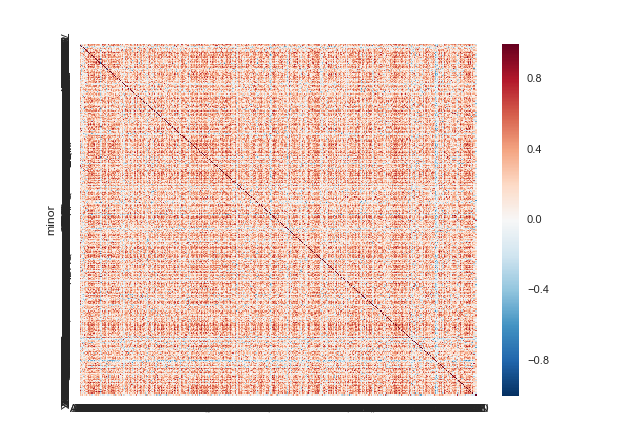

In [129]:
%matplotlib notebook
sns.heatmap(df);

In [19]:
x = df.loc[df.any().values,df.any().values]

In [130]:
xd = np.sqrt( np.clip( 2 * (1 - x ** 2), 0.00001, 2.) )

In [131]:
# %matplotlib inline
Y = fc.linkage(x.values, method='centroid')

In [132]:
Z = sch.dendrogram(Y, orientation='right', no_plot=True)

### A dendrogram helps, by imposing a tree structure

<IPython.core.display.Javascript object>


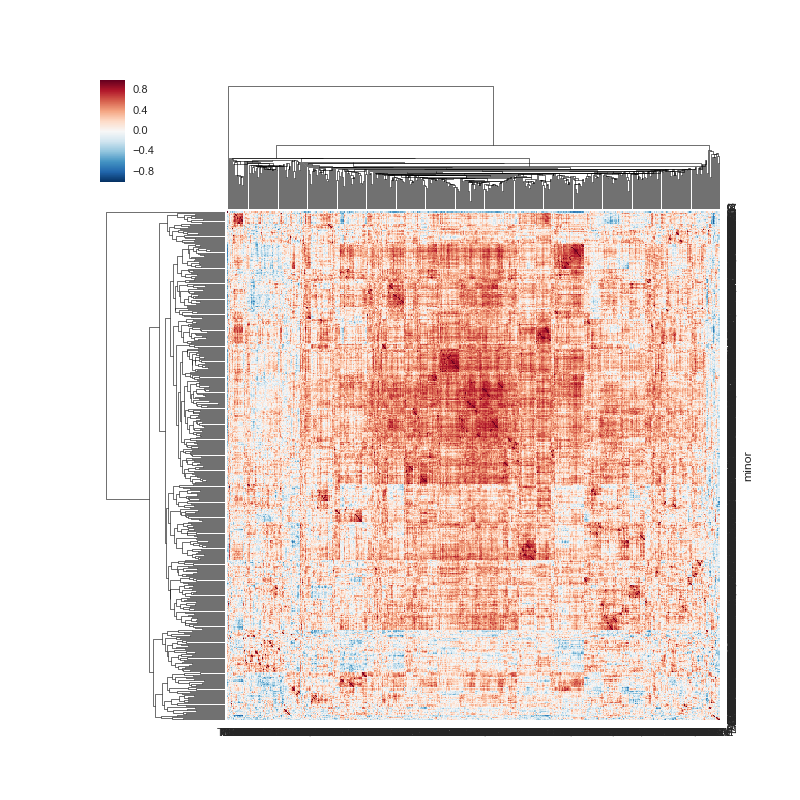

In [133]:
%matplotlib notebook
sns.clustermap(x, col_linkage=Y);

In [27]:
Yd = fc.linkage(compute_distance(x).values, method='centroid')
# Zd = sch.dendrogram(Yd, orientation='right', no_plot=True)

## Dissimilarity matrix

The dissimilarity matrix obtained with the distance transformation

$$ d_{i,j} = \sqrt{ 2 ( 1 - \sigma_{i,j}}$$

<IPython.core.display.Javascript object>


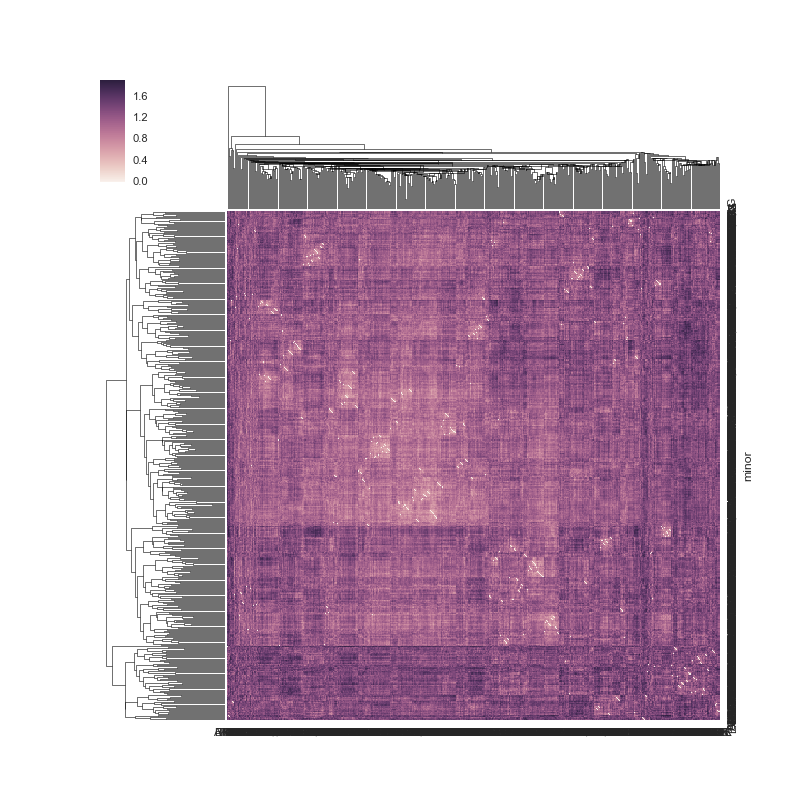

In [134]:
%matplotlib notebook
sns.clustermap(compute_distance(x), col_linkage=Yd);

In [139]:
from graphs import compute_distance, construct_mst, construct_pmfg

In [140]:
mst = construct_mst(x)

In [141]:
pmfg = construct_pmfg(df)

In [142]:
from graphs import prepare_datasources, plot_graph, hex_palette, compute_centrality_metrics
from bokeh.plotting import figure, show
from bokeh.io import output_notebook, push_notebook
output_notebook()

Loading BokehJS ...

## Criteria for filtering correlation matrix

Correlation matrix can be filtered to achieve a parsimonious representation


- Threshold
- Bonferroni correction
- Random Matrix Theory
- Geometric Criteria
  - Minimum Spanning Tree
  - Planar Maximally Filtered Graph

# Minimum Spanning Tree

Connects all the vertices together with the minimal total weighting for its edges.

In [144]:
TOOLS = 'box_zoom,wheel_zoom,box_select,resize,reset,hover,save'
p_mst = figure(toolbar_location='left', tools=TOOLS)


ds_nodes, ds_edges = prepare_datasources(mst, k=.011, iterations=150)
plot_graph(p_mst, ds_edges, ds_nodes)

show(p_mst);

# Planar Maximally Filtered Graph

The PMFG is a maximal planar graph that contains the MST as a subgraph and retains the largest correlations across edges.

In [ ]:
def construct_pmfg(df_corr_matrix):
    df_distance = compute_distance(df_corr_matrix)
    ...
    index_upper_triangular = np.triu_indices(dist_matrix.shape[0],1)
    isort = np.argsort( dist_matrix[index_upper_triangular] )
    G = nx.Graph()
    for k in range(0,len(isort)):
        u = index_upper_triangular[0][isort[k]]
        v = index_upper_triangular[1][isort[k]]
        
        G.add_edge(u, v, {'weight': float(dist_matrix[u,v])})
        
        if not planarity.is_planar(G):
            G.remove_edge(u,v)

    return G

In [145]:
TOOLS = 'box_zoom,wheel_zoom,box_select,resize,reset,hover,save'
pwebgl4 = figure(toolbar_location='left', tools=TOOLS)


ds_nodes, ds_edges = prepare_datasources(pmfg, k=.021, iterations=150)
plot_graph(pwebgl4, ds_edges, ds_nodes)

show(pwebgl4);

# PMFG

(picture taken from paper)


Red: central nodes

Blue: peripheral nodes

Yellow: 30 most peripheral nodes, node size coding the Markowitz weights

![xxx](pics/graph.png)
